# This notebook shows how to design synthetic sequences by using in silico evolution for Kenyon Cells.
#### It uses the selected enhancers from the MM_Cbust_Homer_Motif notebook
#### It consists of:
* Generating GC-adjusted random sequences:
* Performing in silico evolution and random drift experiments.
* Plotting the findings.
* Printing generated DNA sequences in nucleotide letters.
#### Intermediate files are saved to ./data/deepflybrain folder
#### Figures are saved to ./figures/evolution_from_scratch

### General imports


In [1]:
import sys  
import os
import pickle
import utils
import numpy as np
import scipy
import tensorflow as tf
tf.disable_eager_execution()
tf.logging.set_verbosity(tf.logging.ERROR)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use("default")
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

### Loading DeepFlyBrain data to be used for the initialization of shap.DeepExplainer


In [2]:
print('Loading data...')
f = open('./data/deepflybrain/DeepFlyBrain_nonAugmented_data.pkl', "rb")
nonAugmented_data_dict = pickle.load(f)
f.close()

Loading data...


### Loading the model and initializing shap.DeepExplainer


In [3]:
print('Loading model...')
import shap
tf.disable_eager_execution()
rn=np.random.choice(nonAugmented_data_dict["train_data"].shape[0], 250, replace=False)
model_dict = {}
exp_dict = {} 

name = "DeepFlyBrain"
model_json_file = "models/deepflybrain/model.json"
model_hdf5_file = "models/deepflybrain/model_epoch_83.hdf5"
model_dict[name] = utils.load_model(model_json_file, model_hdf5_file)
exp_dict[name] = shap.DeepExplainer((model_dict[name].inputs, model_dict[name].layers[-1].output), nonAugmented_data_dict["train_data"][rn])


Loading model...


### This code:
* Takes genomic regions fasta file and creates GC adjusted random sequences
* Performs in silico evolution on random sequences

In [4]:
# path_to_use_GC_content = "./data/deepflybrain/Genomic_KC_regions.fa"
# number_of_random_regions = 6000
# seq_len = 500

# evolved_seq_6000_dict = {}
# evolved_seq_6000_dict["X"] = utils.random_sequence_gc_adjusted(seq_len, number_of_random_regions, path_to_use_GC_content)

# path_to_save = "data/deepflybrain/FLY_KC_EFS_6000_withmut.pkl"

# evolved_seq_6000_dict["mut_pred"], \
# evolved_seq_6000_dict["mut_loc"] = utils.insilico_evolution(regions = evolved_seq_6000_dict["X"],
#                                                                 model = model_dict["DeepFlyBrain"],
#                                                                 class_no = 35,
#                                                                 n_mutation = 20,
#                                                                 rc = False
#                                                                )
# # save the final file
# import pickle
# f = open(path_to_save, "wb")
# pickle.dump(evolved_seq_6000_dict,f)
# f.close()


In [4]:
import pickle
f = open("data/deepflybrain/FLY_KC_EFS_6000_withmut.pkl", "rb")
evolved_seq_6000_dict = pickle.load(f)
f.close()

### This code:
* Performs in random drift mutations on the random sequences generated above

In [6]:
# random_drift_6000_dict = {}
# random_drift_6000_dict["X"] = np.copy(evolved_seq_6000_dict["X"])

# random_drift_6000_dict["mut_pred"], \
# random_drift_6000_dict["mut_loc"] = utils.random_drift(regions = random_drift_6000_dict["X"],
#                                                                 model = model_dict["DeepFlyBrain"],
#                                                                 class_no = 35,
#                                                                 n_mutation = 20,
#                                                                 rc = False
#                                                                )
# # save the final file
# import pickle
# f = open(data/deepflybrain/FLY_KC_RandomDrift_6000_withmut.pkl, "wb")
# pickle.dump(random_drift_6000_dict,f)
# f.close()

In [7]:
import pickle
f = open("data/deepflybrain/FLY_KC_RandomDrift_6000_withmut.pkl", "rb")
random_drift_6000_dict = pickle.load(f)
f.close()

### Reading fasta file

In [8]:
Genomic_KC = utils.prepare_data("./data/deepflybrain/Genomic_KC_regions.fa")
Genomic_KC_dict = {"ids":np.array(Genomic_KC[1]),"X":Genomic_KC[0]}

### Plotting GC-content comparison of Genomic and GC-adjusted random sequences

Text(0, 0.5, 'Average GC-content')

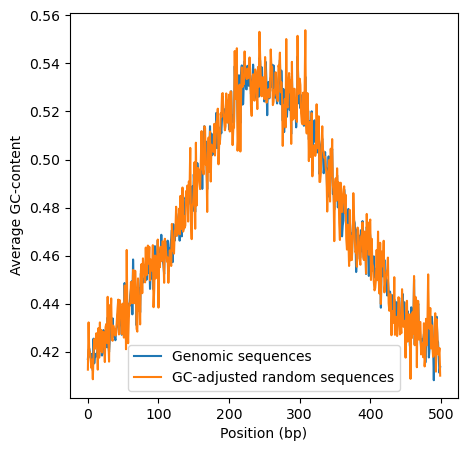

In [9]:
plt.figure(figsize=(5,5,))
plt.plot(np.sum(Genomic_KC_dict["X"][:,:,1]+Genomic_KC_dict["X"][:,:,2],axis=0)/len(Genomic_KC_dict["X"]), label="Genomic sequences")
plt.plot(np.sum(evolved_seq_6000_dict["X"][:,:,1]+evolved_seq_6000_dict["X"][:,:,2],axis=0)/len(evolved_seq_6000_dict["X"]), label="GC-adjusted random sequences")
plt.legend()
plt.xlabel("Position (bp)")
plt.ylabel("Average GC-content")

### Smoothed plotting GC-content comparison of Genomic and GC-adjusted random sequences

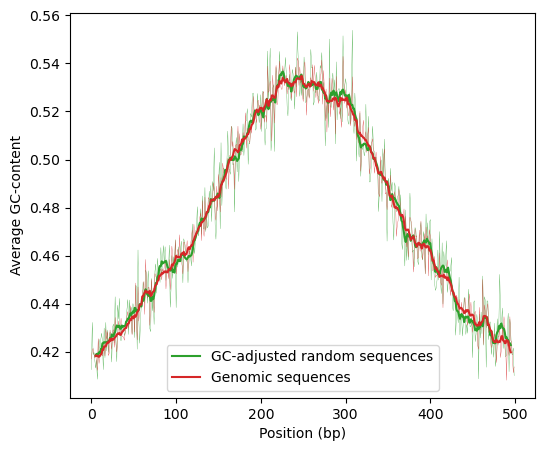

In [11]:
def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='valid')
    return y_smooth

plt.figure(figsize=(6,5))
plt.plot((np.mean(evolved_seq_6000_dict["X"][:,:,1] + evolved_seq_6000_dict["X"][:,:,2],axis=0)),color="C2",linewidth=0.2)
plt.plot((np.mean(Genomic_KC_dict["X"][:,:,1] + Genomic_KC_dict["X"][:,:,2],axis=0)),color="C3",linewidth=0.2)

smt_val = 10
plt.plot(range(5,496),smooth(np.mean(evolved_seq_6000_dict["X"][:,:,1] + evolved_seq_6000_dict["X"][:,:,2],axis=0),smt_val),label="GC-adjusted random sequences",color="C2")
plt.plot(range(5,496),smooth(np.mean(Genomic_KC_dict["X"][:,:,1] + Genomic_KC_dict["X"][:,:,2],axis=0),smt_val),label="Genomic sequences",color="C3")

plt.legend()
plt.xlabel("Position (bp)")
plt.ylabel("Average GC-content")
plt.savefig("figures/evolution_from_scratch/GC_content_Genomic_vs_Random.pdf",transparent=True)

### Plotting prediction scores at each mutational step for both random drift and directed evolution

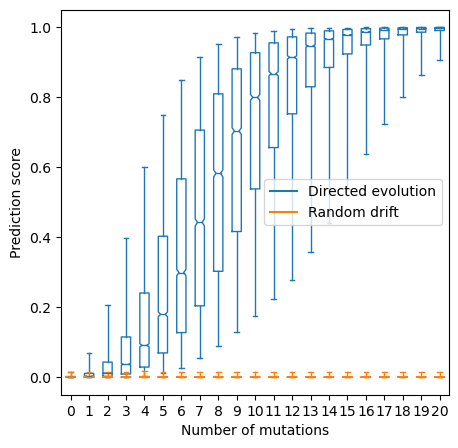

In [13]:
plt.figure(figsize=(5,5))
c="C0"
_ = plt.boxplot(evolved_seq_6000_dict["mut_pred"][:,:,34],notch=True,showfliers=False, whis=[5,95],
                boxprops=dict(color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c),
                medianprops=dict(color=c),
                )
plt.plot([],label="Directed evolution",color="C0")

c="C1"
_ = plt.boxplot(random_drift_6000_dict["mut_pred"][:,:,34],notch=True,showfliers=False, whis=[5,95],
                boxprops=dict(color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c),
                medianprops=dict(color=c),
                )
plt.plot([], label="Random drift",color="C1")

_ = plt.xticks(range(1,22),list(range(21)))
plt.legend()
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.savefig("figures/evolution_from_scratch/EFS_vs_RandomDrift_PredistionDist.pdf",transparent=True)

### Plotting prediction scores at each mutational step for selected regions

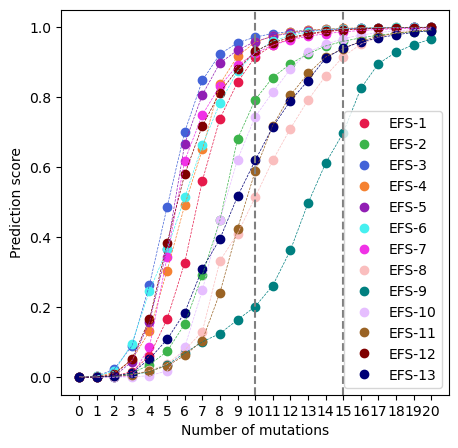

In [93]:
colors_ = ['#e6194b', '#3cb44b', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#fabebe', '#008080', '#e6beff', '#9a6324','#800000', '#000075']

plt.figure(figsize=(5,5))
for k,i in enumerate([1,21,32,35,59,61,91,102,117,120,126,135,148]):
    _ = plt.plot(evolved_seq_6000_dict["mut_pred"][i,:21,34].T,label="EFS-"+str(k+1),linestyle="",marker="o",color=colors_[k])
plt.legend()
for k,i in enumerate([1,21,32,35,59,61,91,102,117,120,126,135,148]):
    _ = plt.plot(evolved_seq_6000_dict["mut_pred"][i,:21,34].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color=colors_[k])
_ = plt.xticks(range(21),list(range(21)))
plt.axvline(x=10,linestyle="--",color="gray")
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.savefig("figures/evolution_from_scratch/EFS_SelectedSeqs_Prediction.pdf",transparent=True)

### Plotting prediction scores of evolved sequences with 20 mutations showing all the classes

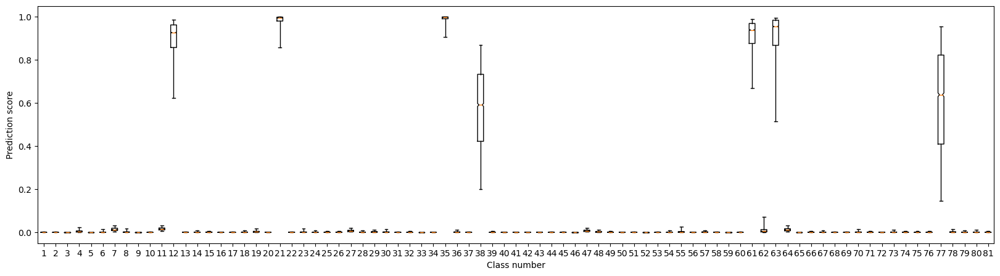

In [41]:
plt.figure(figsize=(20,5))
_ = plt.boxplot(evolved_seq_6000_dict["mut_pred"][:,20,:],notch=True,showfliers=False, whis=[5,95])
#_ = plt.xticks(range(1,22),list(range(21)))
plt.xlabel("Class number")
plt.ylabel("Prediction score")
plt.savefig("figures/evolution_from_scratch/prediction_score_after20mut_allclasses.pdf",transparent=True,dpi=300)

### Plotting prediction scores of random sequences showing all the classes

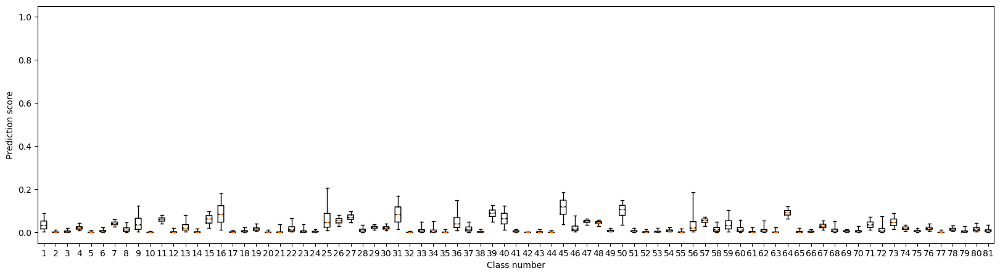

In [14]:
plt.figure(figsize=(20,5))
_ = plt.boxplot(evolved_seq_6000_dict["mut_pred"][:,0,:],notch=True,showfliers=False, whis=[5,95])
#_ = plt.xticks(range(1,22),list(range(21)))
plt.xlabel("Class number")
plt.ylabel("Prediction score")
plt.ylim([-0.05,1.05])
plt.savefig("figures/evolution_from_scratch/prediction_score_randomsequences_allclasses.pdf",transparent=True,dpi=300)

### Plotting prediction scores of both random and evolved sequences with 20 mutations showing all the classes

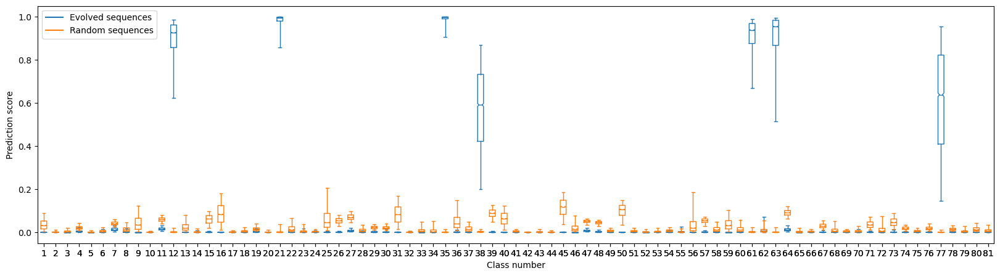

In [24]:
plt.figure(figsize=(20,5))
c="C0"
_ = plt.boxplot(evolved_seq_6000_dict["mut_pred"][:,20,:],notch=True,showfliers=False, whis=[5,95], 
                boxprops=dict(color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c),
                medianprops=dict(color=c),
                )
plt.plot([],label='Evolved sequences',color='C0')

c="C1"
_ = plt.boxplot(evolved_seq_6000_dict["mut_pred"][:,0,:],notch=True,showfliers=False, whis=[5,95], 
                boxprops=dict(color=c),
                capprops=dict(color=c),
                whiskerprops=dict(color=c),
                flierprops=dict(color=c, markeredgecolor=c),
                medianprops=dict(color=c),
                )
plt.plot([],label='Random sequences',color='C1')

#_ = plt.xticks(range(1,22),list(range(21)))
plt.xlabel("Class number")
plt.ylabel("Prediction score")
plt.ylim([-0.05,1.05])
plt.legend()
plt.savefig("figures/evolution_from_scratch/prediction_score_randomsequences_after20mut_allclasses.pdf",transparent=True,dpi=300)

### Plotting distance between farthest mutations after 10 mutations

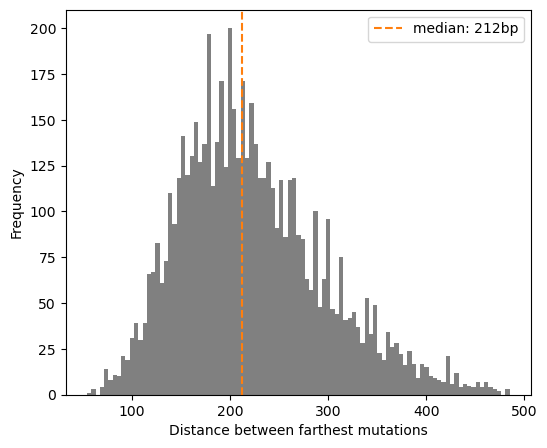

In [84]:
mut_loc_only_loc = np.zeros(evolved_seq_6000_dict["mut_loc"].shape)
for i,reg in enumerate(evolved_seq_6000_dict["mut_loc"]):
    for j,mut in enumerate(reg):
        mut_loc_only_loc[i,j] = int(mut.split("_")[0])
        
plt.figure(figsize=(6,5))
plt.axvline(x=np.median(np.max(mut_loc_only_loc[:,:10],axis=1) - np.min(mut_loc_only_loc[:,:10],axis=1)),color="C1",linestyle="--",label="median: 212bp")
plt.legend()
_ = plt.hist(np.max(mut_loc_only_loc[:,:10],axis=1) - np.min(mut_loc_only_loc[:,:10],axis=1),bins=99,color="gray")
plt.xlabel("Distance between farthest mutations")
plt.ylabel("Frequency")
plt.savefig("figures/evolution_from_scratch/mutation_span_10muts.pdf",transparent=True,dpi=300)

### Plotting the distribution of mutation locations after 10 mutations

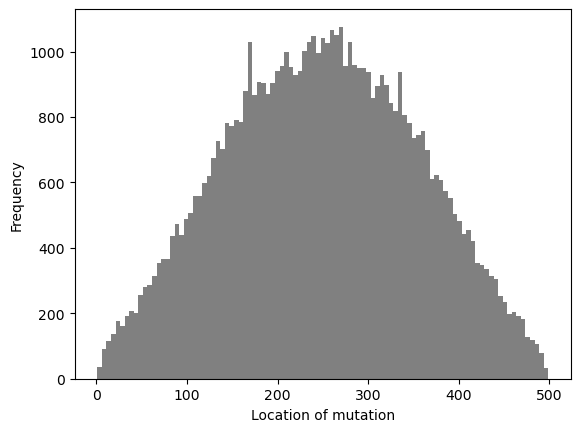

In [85]:
mutlocs_ = []
for muts in evolved_seq_6000_dict["mut_loc"]:
    for mutloc_ in muts[:10]:
        mutlocs_.append(int(mutloc_.split("_")[0]))
_ = plt.hist(mutlocs_,bins=99,color="gray")
plt.xlabel("Location of mutation")
plt.ylabel("Frequency")
plt.savefig("figures/evolution_from_scratch/distribution_of_mutation_locs_10mut.pdf",transparent=True,dpi=300)

### Plotting contribution scores of random and fully evolved sequences

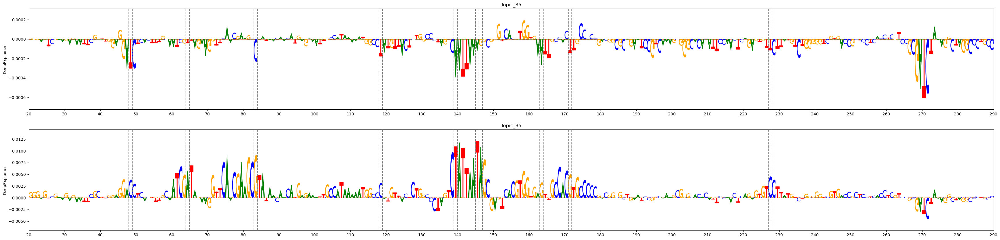

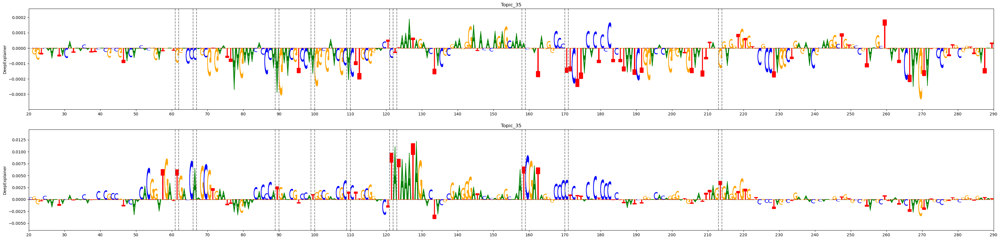

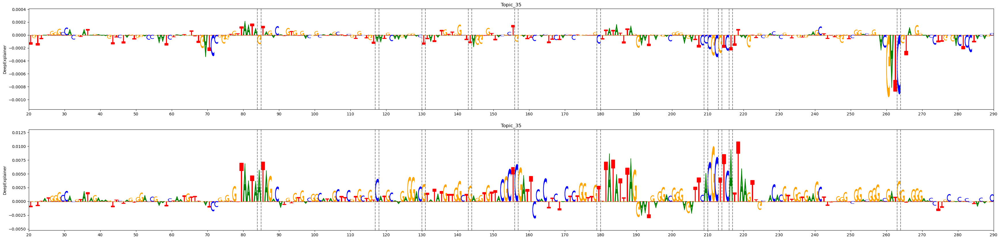

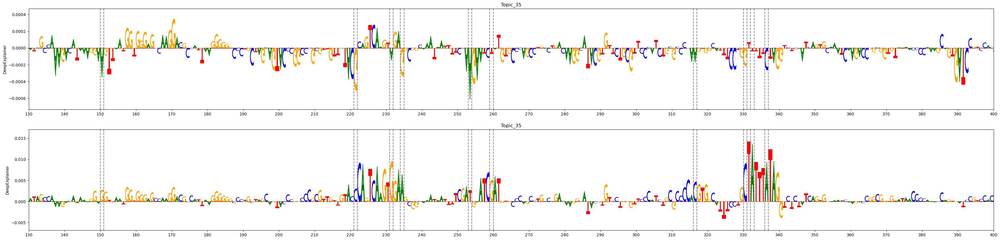

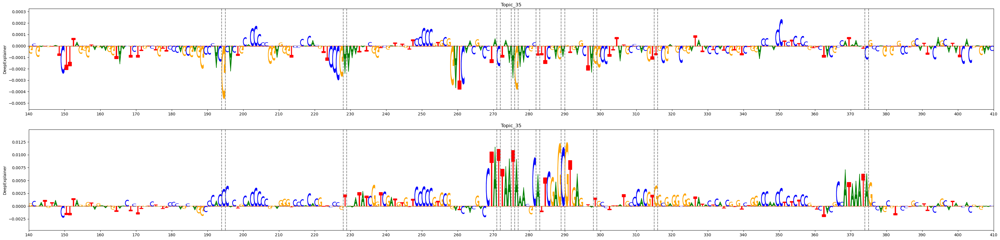

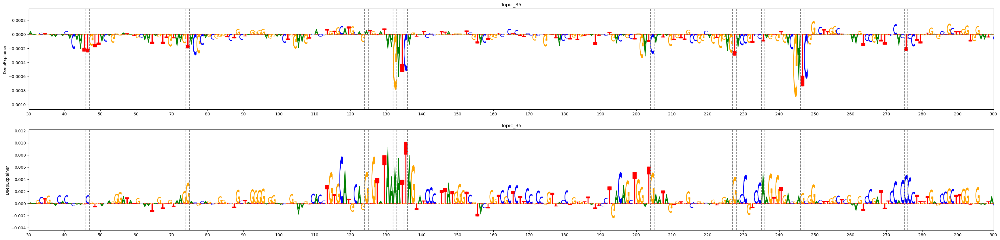

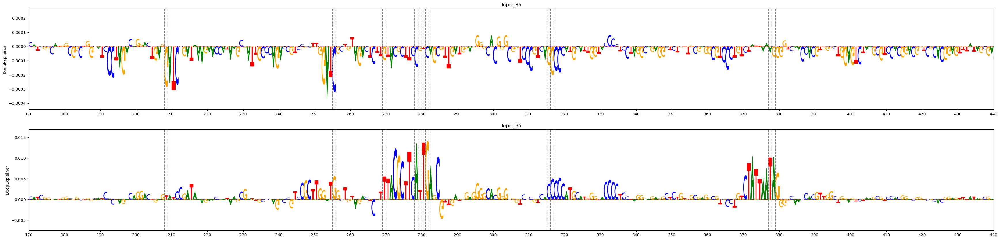

In [87]:
locs = [[20,290],
        [20,290],
        [20,290],
        [130,400],
        [140,410],
        [30,300],
        [170,440]]

for k,id_ in enumerate([1,21,32,35,59,61,91]):
    
    st = locs[k][0]
    end = locs[k][1]

    nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
    start_x = np.copy(evolved_seq_6000_dict["X"][id_:id_+1])

    ntrack = 2
    fig = plt.figure(figsize=(43.2,ntrack*5))
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=1, seq_onehot=start_x, class_no = 35)

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_][:10]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=2, seq_onehot=start_x, class_no = 35)

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_][:10]):

        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")

    ax1.set_xlim([st,end])
    ax2.set_xlim([st,end])


    plt.savefig("figures/evolution_from_scratch/EFS"+str(k+1)+"_deepexplainer_mut0_mut10_st"+str(st)+"_end"+str(end)+"_topic17.pdf",transparent=True)

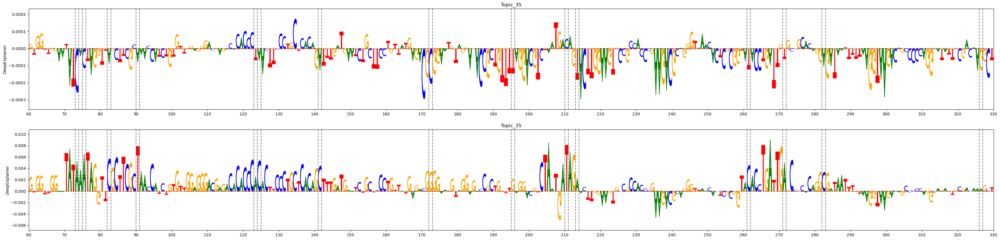

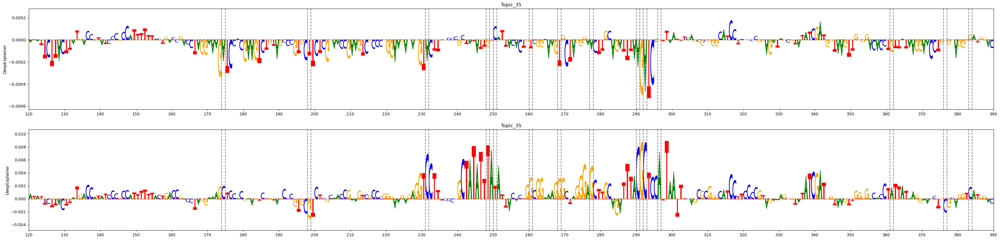

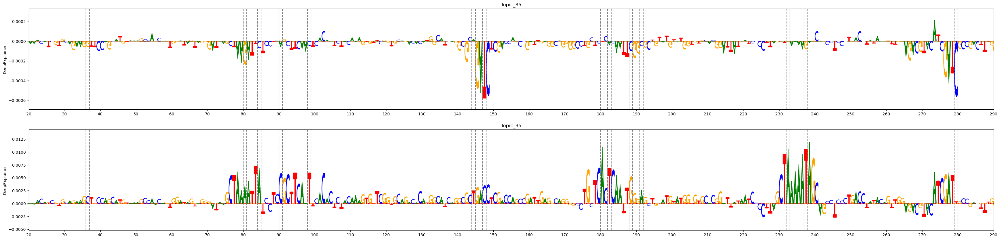

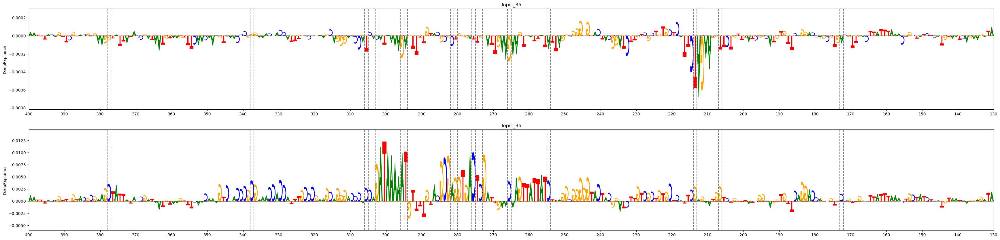

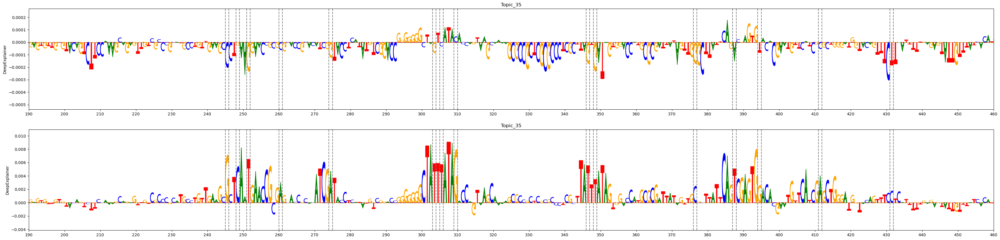

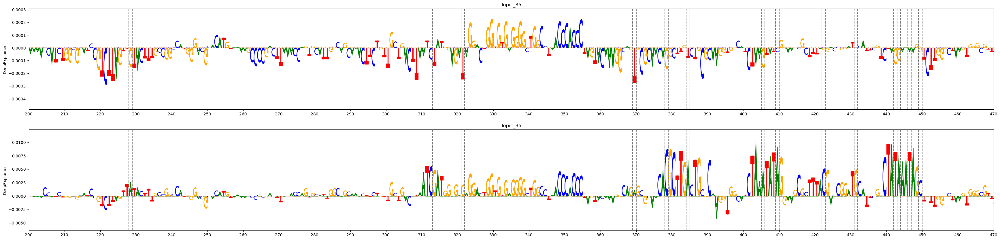

In [86]:
locs = [[60,330],
        [120,390],
        [20,290],
        [130,400],
        [190,460],
        [200,470]]

for k,id_ in enumerate([102,117,120,126,135,148]):
    
    st = locs[k][0]
    end = locs[k][1]

    nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
    start_x = np.copy(evolved_seq_6000_dict["X"][id_:id_+1])

    ntrack = 2
    fig = plt.figure(figsize=(43.2,ntrack*5))
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=1, seq_onehot=start_x, class_no = 35)

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=2, seq_onehot=start_x, class_no = 35)

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_][:15]):

        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")

    ax1.set_xlim([st,end])
    ax2.set_xlim([st,end])


    plt.savefig("figures/evolution_from_scratch/EFS"+str(k+1+7)+"_deepexplainer_mut0_mut15_st"+str(st)+"_end"+str(end)+"_topic17.pdf",transparent=True)

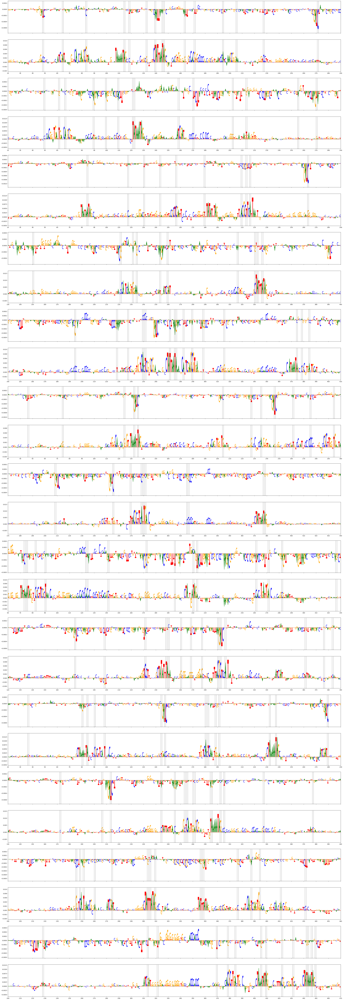

In [12]:
locs = [[20,290,15],
        [20,290,15],
        [20,290,10],
        [130,400,10],
        [140,410,15],
        [30,300,15],
        [170,440,10],
        [60,330,15],
        [120,390,15],
        [20,290,15],
        [130,400,15],
        [190,460,15],
        [200,470,15]]

ntrack = 26
fig = plt.figure(figsize=(43.2,ntrack*5))

for k,id_ in enumerate([1,21,32,35,59,61,91,102,117,120,126,135,148]):
    
    st = locs[k][0]
    end = locs[k][1]

    nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
    start_x = np.copy(evolved_seq_6000_dict["X"][id_:id_+1])

    
    ax1 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=k*2+1, seq_onehot=start_x, class_no = 35)

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_][:locs[k][2]]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

    ax2 = utils.plot_deepexplainer_givenax(explainer=exp_dict["DeepFlyBrain"], fig=fig, ntrack=ntrack, track_no=k*2+2, seq_onehot=start_x, class_no = 35)

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_][:locs[k][2]]):

        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax2.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")

    ax1.set_title("")
    ax1.set_ylabel("")
    ax2.set_title("")
    ax2.set_ylabel("")
    ax1.set_xticklabels([])
    ax1.set_xlim([st,end])
    ax2.set_xlim([st,end])


plt.savefig("figures/evolution_from_scratch/EFS_all_deepexplainer_mut0_mut10_st_topic35.pdf",transparent=True)

### Printing generated DNA sequences in nucleotide letters.

In [88]:
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

for id_ in [1,21,32,35,59,61,91]: 

    start_x = np.copy(evolved_seq_6000_dict["X"][id_:id_+1])

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_]):
        if i>=15:
            break 
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

    print(">id"+str(id_)+"_mut10")

    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")


>id1_mut10
GATACACCGGTCACCGCCAGGGGAGTCGAAGAGAATTCGCTTGGAGGACCTCACTTTGCAATCGATAGAAGGTTCAACGAAGCGTATAACAACATGAGAAATTGCCATAAAAATAGCCCATGTTACTCTGGCGCTAGTCTATTAATAGCGAGTCACGTGGTGAGTTGCCACGTGCCCCCGACGGCGCTGAATCCATCAAAGCGGGAACACATTCCAACTCAGAGTGTCCTTATGTCTGGGGGTCGTGACCGCTCCTCACCTCGTCCGCGATTTAAAGGCTAGGCCCTGCCCAGTCACTATTTCGGAGGTCTCGGCTAGCCCCTAACAGTGATCTCGTTTCGACGTTCGCTCTATTACACTAGCAAAAAGAGCATTTTTACAAAAGTTTAGAGAAAAGTCCCAACCTGTTAAGAAATTAAGGCCTGAAGCTGATTTGGTAGACCGTATTAATACACTCAAGACTCTGAGGGGGTTTCATTAGTGAGGGATACCCCCTTTAT
>id21_mut10
GGCAGACTACTACTCTGACTCGGTCAAATACATAACATTCACGCCGTACCACACGGATGATTGACCAAGCGTGAATTAAGAAACACCCATGAACGTCCATGGCGAACGCTCTTGCGGAACTTATAAATAGAACTACGCGAAGGGATACACAGAGCAAATCGATAGGGCCCCTCTTACACTCCCTCTTAATCTGGACACAGGGGTGTAATTTAGTGAGGTGTGTTCGCCTAGGCTGAGAACGCAAGGCTGTGCCGTTAGCTTAATACTAAGGATGCCGTTGCGGTTGATATGAAAGTACCAGTACGACCCCACTAAAGGCTGGAATTGGAACGCTATCAATTCGAACGTCCATGCCCTTGGTGTAGCCAGGGGCTGTTTAATCAACGTTTGCCCTCTAGAAAAAGGGCCATCGATCAGATTCTCTAAGGACCATTTAACCAGTTTCCCCAAGTTGCGTTCGCCTGGAGACAGCCGCT

In [89]:
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

for id_ in [102,117,120,126,135,148]: 

    start_x = np.copy(evolved_seq_6000_dict["X"][id_:id_+1])

    for i, mut_ in enumerate(evolved_seq_6000_dict["mut_loc"][id_]):
        if i>=15:
            break 
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

    print(">id"+str(id_)+"_mut15")

    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")


>id102_mut15
AATCGGATTATGCTAGCACACAGTTGATTCCAAGCTTGCAACTTTTTAGCAATTCCTGTGGTGGTTGGAATATAAATAGGTTCGCTTCGCTAACCATCTGTGTTGGAGGGACGAGACACACCCACACTTCCCTGCTCACAGCTTTGATGAATCTGCTTCCTGTTATGAGACGGGGAATGTAGGAGACCGCTGTTTGAGGACGTCTAATGATAGAACTTGGAAGTGCCGCCACCCGAAGACGCAGGGTTAACACTCGCGGTACACCTGATTGAGCCGCACAGGCGATAATTTTTAAGGTAAGACAGCCCCCAGGCATATTGCGACAAAGCTTTATCTGGCGAAACGTGTTTCAACCTTTTCGTAGAGCCTGGTAAGTTCTTACTACCCACGCTTCCAGAATGTTTACTAGGATAAACCAGACCACGCGACTGTACATTGATAGATACGTAGCATAATTGAGTAAACCAATTGGAATGCGGTTTTGCATTAGGTGATTAGCG
>id117_mut15
TCTAATTGAACAATGACCCCCATAAGATGGCTTCGCAATGTCATGAACTTTCGTTCTAGTCATCCACTCACGGGGCAAACAGACTCACCTCCGTGCGAGCTACCGTAACTTTCGGACTGAATATTCTTACTTATGACCATATCCCGCCATTTTTTACTGACCGACCTAGGAAAGCTCCACGAAGTCTGTAGCCCGTGCGTCTCGCAACCGAAGTCGCCCGGGAAGAGAGGTCCTTTCCCCGCTATATTTATATTACACTGGCGGAAAGGGCTAGGGAGCTTGCAGATTTACGCTCCATTAATTTCAGCGCGGGCATCCTTCCCCGTAGATAGCGTATATCGATGGTAAGTTGGGGACACCTATTATAAGGAACCTGCGCAGGTCATGGACGTCAAAGATAGCAAGACCGGGTTTGCCACAGAATTGGAGCACAATTAGGAACAGATATGTGCCTTATGGGTAGACAATAATAT